## **Teena Bokde**
### **Data Science - Batch Oct 2024 (Pune) - Assignment 9**
### **PCA**

In [1]:
# Load necessary packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

# Suppress warnings
warnings.filterwarnings('ignore')

from scipy import stats
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA

### **K-Means Clustering with Original Data**

In [3]:
# Load dataste
df = pd.read_csv('wine.csv')
# Keep a copy of the original dataset with 'Type'
df_original = df.copy()
df.head(15)

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
0,1,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,1,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,1,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,1,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735
5,1,14.20,1.76,2.45,15.2,112,3.27,3.39,0.34,1.97,6.75,1.05,2.85,1450
6,1,14.39,1.87,2.45,14.6,96,2.50,2.52,0.30,1.98,5.25,1.02,3.58,1290
7,1,14.06,2.15,2.61,17.6,121,2.60,2.51,0.31,1.25,5.05,1.06,3.58,1295
8,1,14.83,1.64,2.17,14.0,97,2.80,2.98,0.29,1.98,5.20,1.08,2.85,1045
9,1,13.86,1.35,2.27,16.0,98,2.98,3.15,0.22,1.85,7.22,1.01,3.55,1045


In [4]:
# Total no.of rows and columns
df.shape

(178, 14)

In [5]:
# Check for missing values
df.isnull().sum()

,0
Type,0
Alcohol,0
Malic,0
Ash,0
Alcalinity,0
Magnesium,0
Phenols,0
Flavanoids,0
Nonflavanoids,0
Proanthocyanins,0


In [6]:
# Complete information of the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 178 entries, 0 to 177
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Type             178 non-null    int64  
 1   Alcohol          178 non-null    float64
 2   Malic            178 non-null    float64
 3   Ash              178 non-null    float64
 4   Alcalinity       178 non-null    float64
 5   Magnesium        178 non-null    int64  
 6   Phenols          178 non-null    float64
 7   Flavanoids       178 non-null    float64
 8   Nonflavanoids    178 non-null    float64
 9   Proanthocyanins  178 non-null    float64
 10  Color            178 non-null    float64
 11  Hue              178 non-null    float64
 12  Dilution         178 non-null    float64
 13  Proline          178 non-null    int64  
dtypes: float64(11), int64(3)
memory usage: 19.6 KB


In [7]:
# Description of the dataset
df.describe()

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
count,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000
mean,1.938202,13.000618,2.336348,2.366517,19.494944,99.741573,2.295112,2.029270,0.361854,1.590899,5.058090,0.957449,2.611685,746.893258
std,0.775035,0.811827,1.117146,0.274344,3.339564,14.282484,0.625851,0.998859,0.124453,0.572359,2.318286,0.228572,0.709990,314.907474
min,1.000000,11.030000,0.740000,1.360000,10.600000,70.000000,0.980000,0.340000,0.130000,0.410000,1.280000,0.480000,1.270000,278.000000
25%,1.000000,12.362500,1.602500,2.210000,17.200000,88.000000,1.742500,1.205000,0.270000,1.250000,3.220000,0.782500,1.937500,500.500000
50%,2.000000,13.050000,1.865000,2.360000,19.500000,98.000000,2.355000,2.135000,0.340000,1.555000,4.690000,0.965000,2.780000,673.500000
75%,3.000000,13.677500,3.082500,2.557500,21.500000,107.000000,2.800000,2.875000,0.437500,1.950000,6.200000,1.120000,3.170000,985.000000
max,3.000000,14.830000,5.800000,3.230000,30.000000,162.000000,3.880000,5.080000,0.660000,3.580000,13.000000,1.710000,4.000000,1680.000000


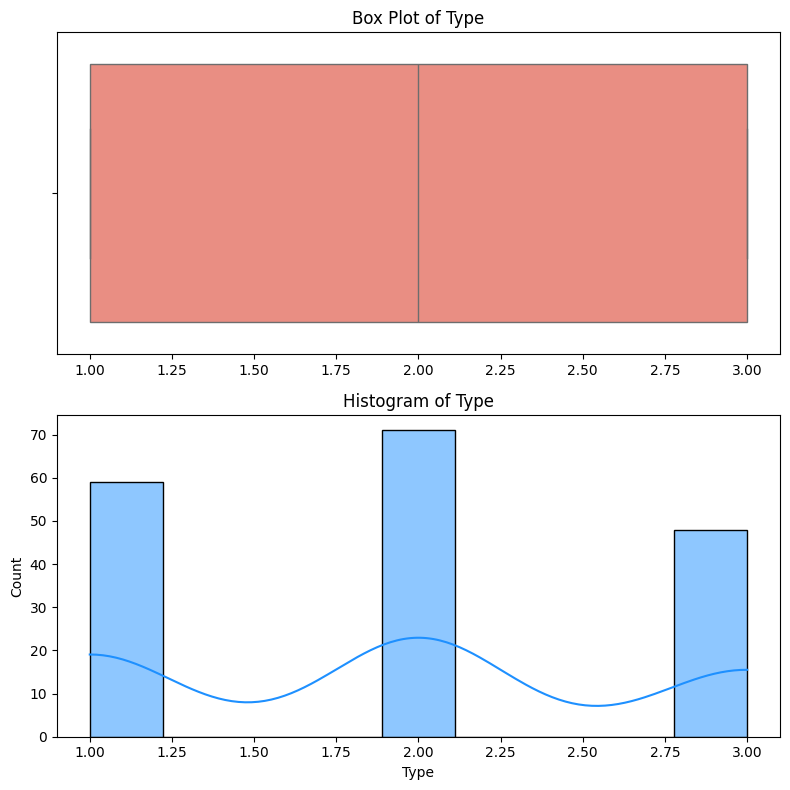

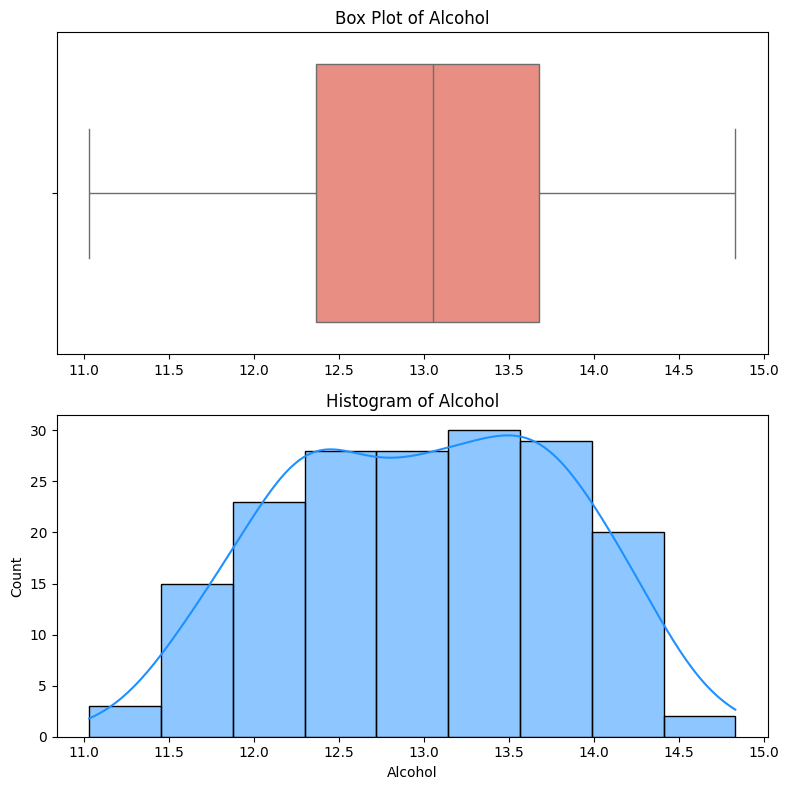

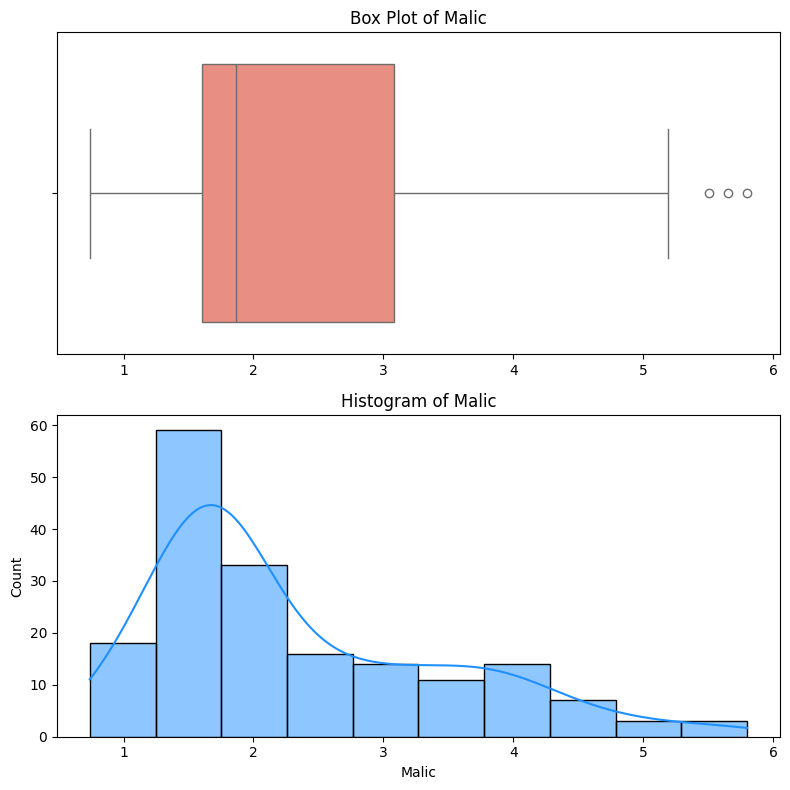

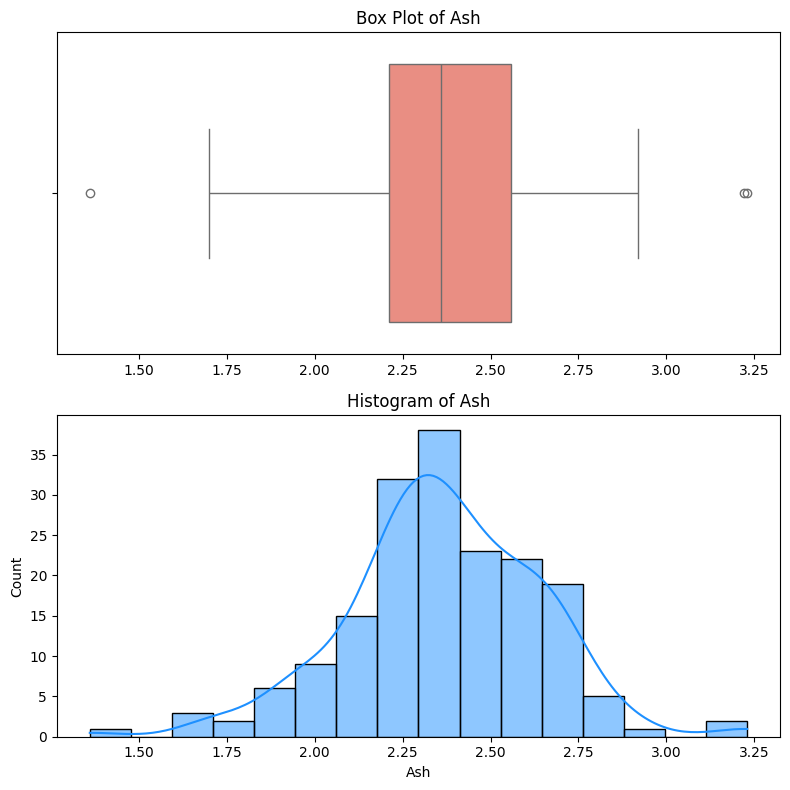

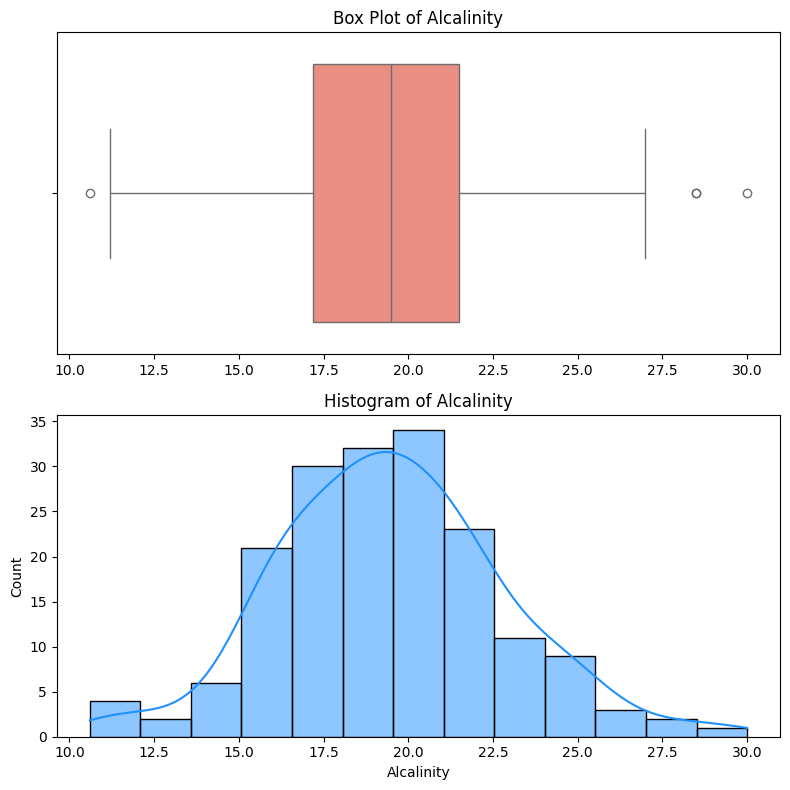

...

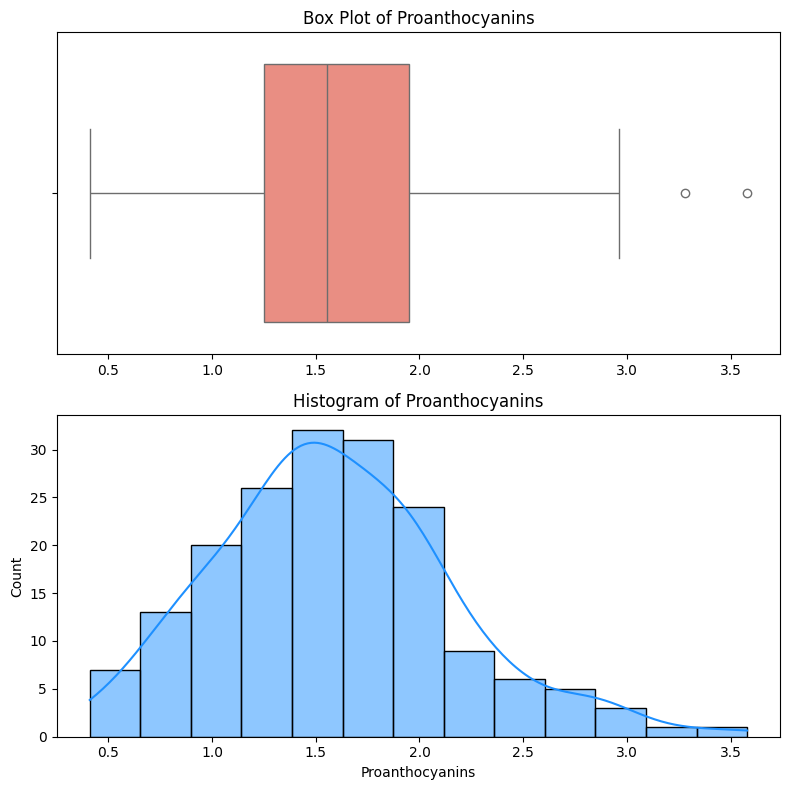

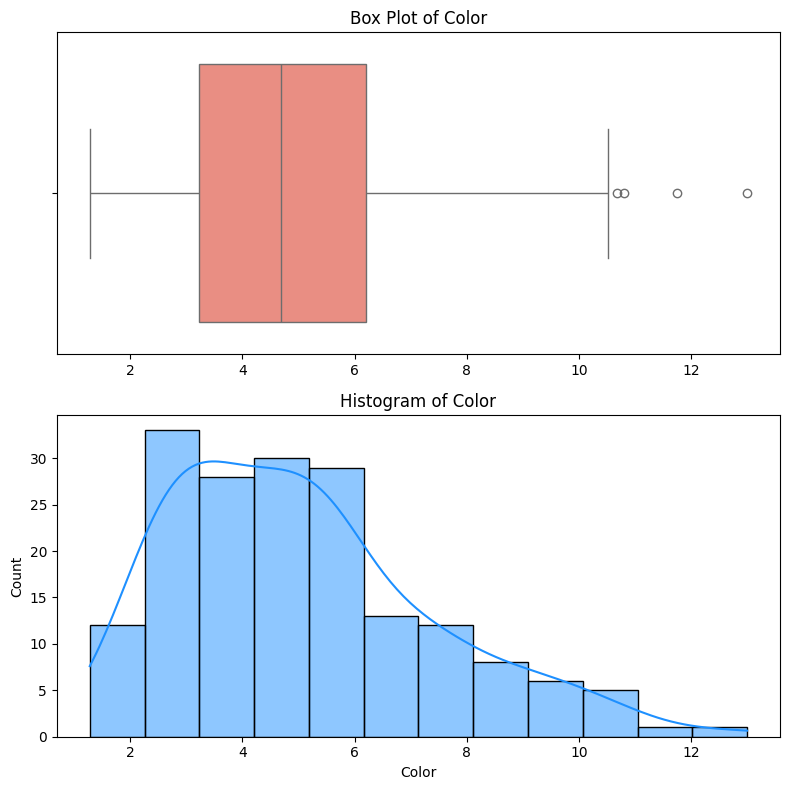

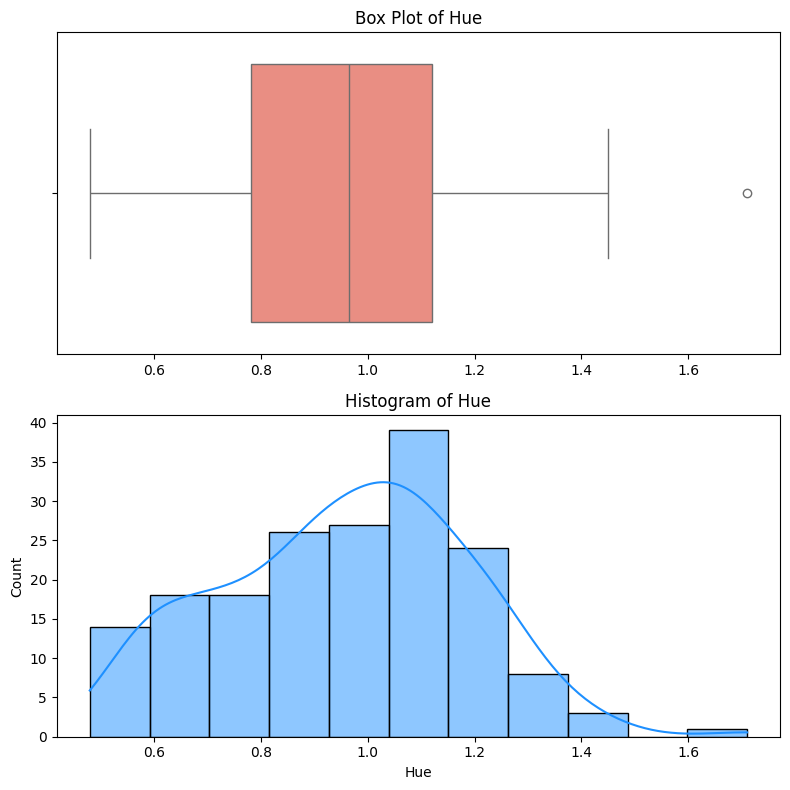

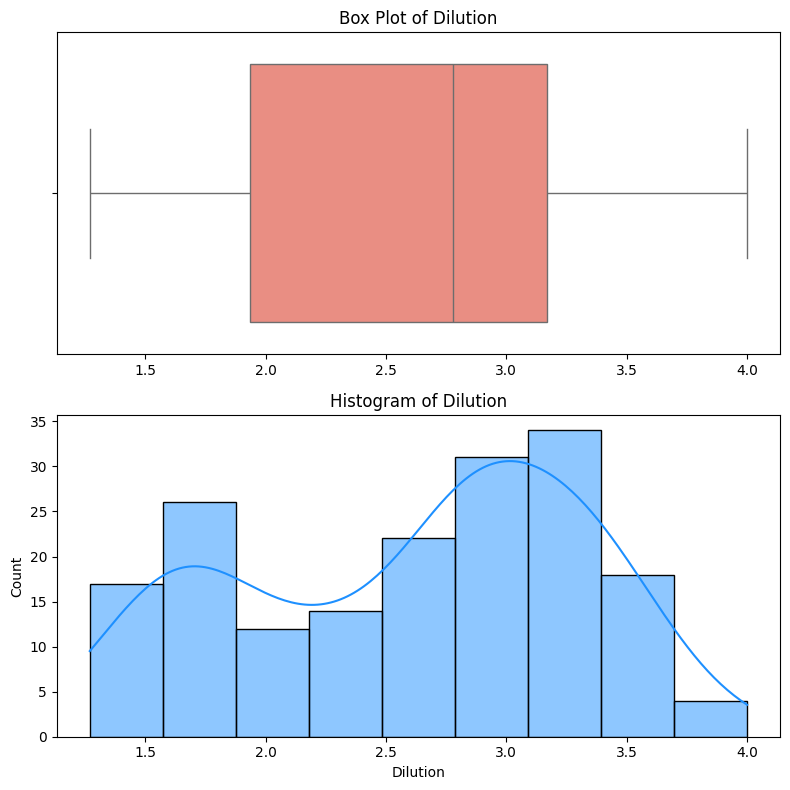

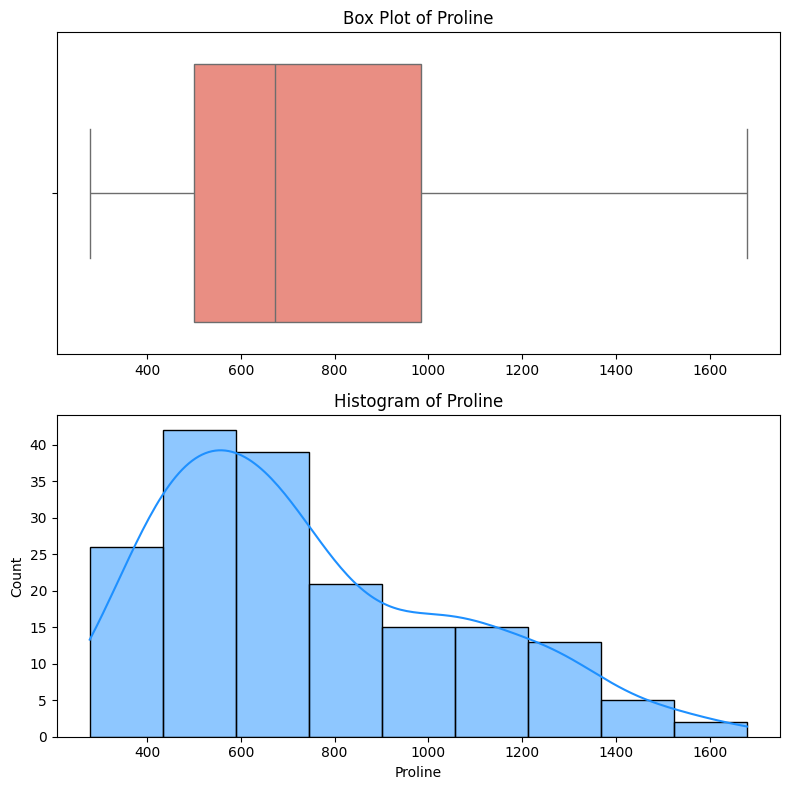

In [8]:
# Function to plot boxplot and histogram
def plot_boxplot_hist(data, column):
    fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(8, 8))

    # Box plot
    sns.boxplot(x=data[column], color='salmon', ax=axes[0])
    axes[0].set_title(f'Box Plot of {column}')
    axes[0].set_xlabel('')

    # Histogram
    sns.histplot(data[column], kde=True, color='dodgerblue', ax=axes[1])
    axes[1].set_title(f'Histogram of {column}')
    axes[1].set_xlabel(column)

    plt.tight_layout()
    plt.show()

# Plot box plot and histogram for each numeric column one by one
for col in df.select_dtypes(include=['float64', 'int64']).columns:
    plot_boxplot_hist(df, col)

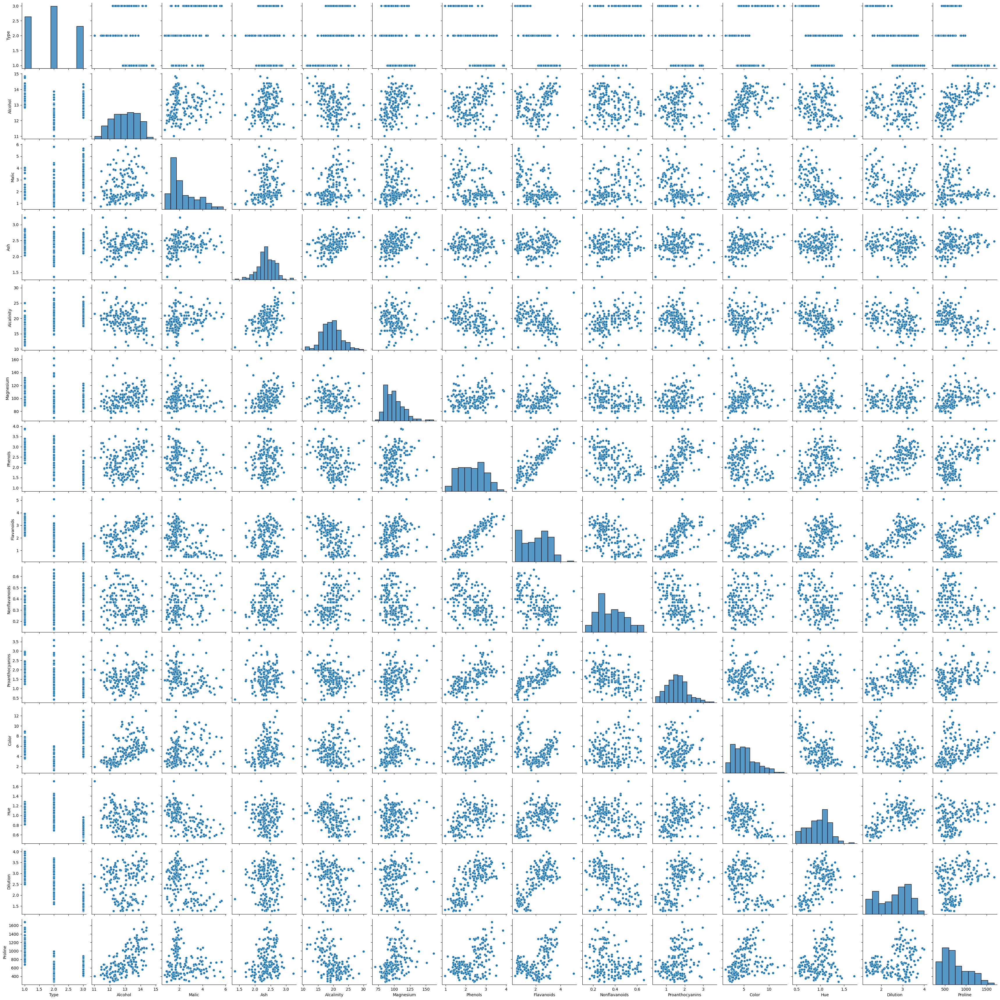

In [9]:
# Pair plot to visualize relationships
sns.pairplot(df)
plt.show()

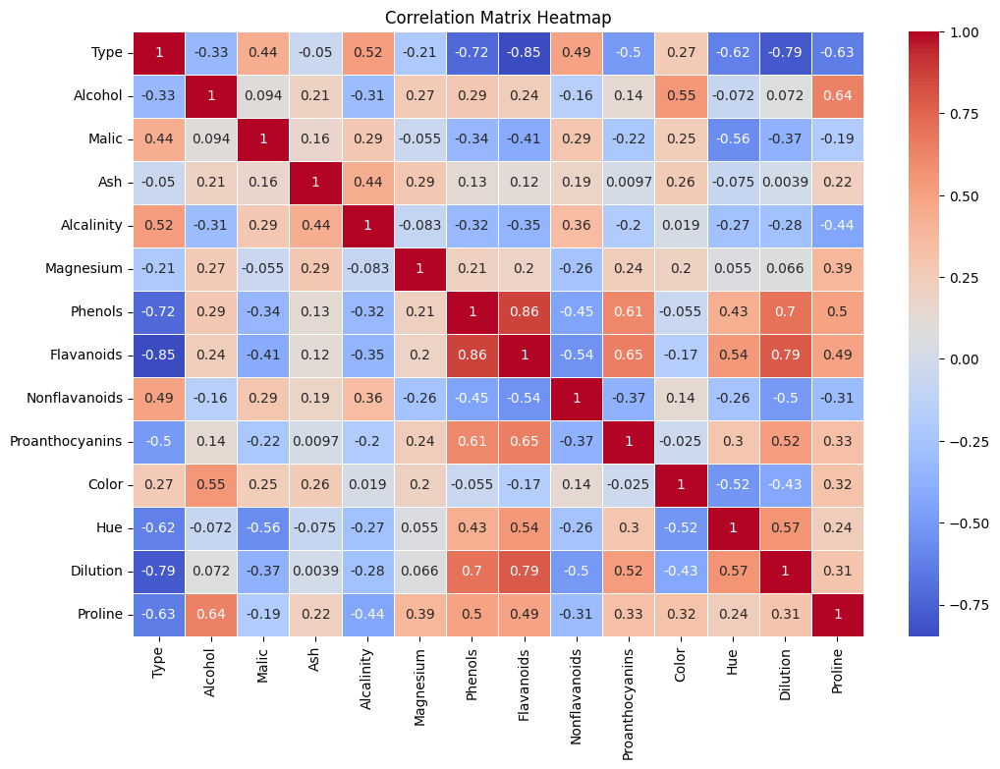

In [10]:
# Correlation matrix
correlation_matrix = df.corr()

# Heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix Heatmap')
plt.show()

In [11]:
# Function to remove outliers using Z-score method
def remove_outliers_zscore(df, threshold=3):
    z_scores = np.abs(stats.zscore(df.select_dtypes(include=[np.number])))
    df = df[(z_scores < threshold).all(axis=1)]
    return df

# Remove outliers from the dataset
df_cleaned = remove_outliers_zscore(df.drop(columns=['Type']))

# Print the number of rows before and after removing outliers
print("Number of rows before removing outliers:", df.shape[0])
print("Number of rows after removing outliers:", df_cleaned.shape[0])

Number of rows before removing outliers: 178
Number of rows after removing outliers: 168


In [12]:
# Print the cleaned dataset
print("Cleaned Dataset:")
df = df_cleaned
df.head()

Cleaned Dataset:


,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
0,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735


In [13]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
df_scaled = scaler.fit_transform(df)

In [14]:
# Find best metrics
inertia = []
for i in range(1,11):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(df)
    inertia.append(kmeans.inertia_)
print(inertia)

[17052600.828698236, 4283689.044159701, 2233318.232240561, 1271129.863208881, 978759.1622956761, 759414.1949686736, 385418.76731638954, 304087.2806251712, 255444.45372481123, 197220.2678893845]


Text(0.5, 1.0, 'Elbow Method')

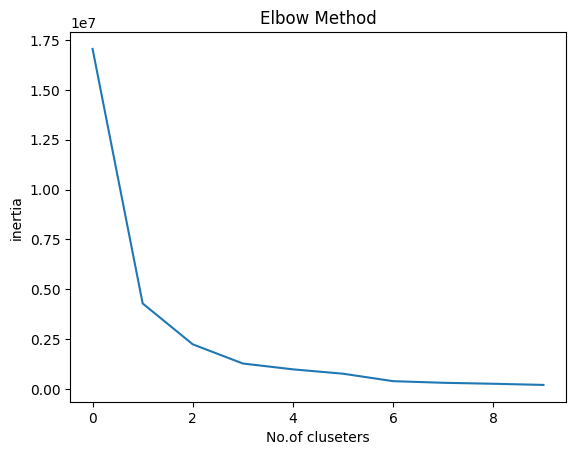

In [15]:
# Plot graph
plt.plot(range(10), inertia)
plt.xlabel('No.of cluseters')
plt.ylabel('inertia')
plt.title('Elbow Method')

In [16]:
kmeans = KMeans(n_clusters=2, random_state=42)  # Assuming you want to cluster into 3 groups
cluster = kmeans.fit(df_scaled)
cluster

KMeans(n_clusters=2, random_state=42)

**In a Jupyter environment, please rerun this cell to show the HTML representation or trust the notebook.**
**On GitHub, the HTML representation is unable to render, please try loading this page with nbviewer.org.**

In [17]:
# Add the cluster labels to the original dataframe
df['Cluster'] = kmeans.labels_

In [18]:
df.head()

,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline,Cluster
0,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065,0
1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050,0
2,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185,0
3,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480,0
4,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735,0


In [19]:
cluster.cluster_centers_

array([[ 0.08835317, -0.42440524, -0.11379035, -0.35523717,  0.06135212,
         0.57498987,  0.64440799, -0.50878646,  0.4600517 , -0.30080912,
         0.53715247,  0.64229942,  0.28835227],
       [-0.1435739 ,  0.68965851,  0.18490932,  0.5772604 , -0.0996972 ,
        -0.93435854, -1.04716298,  0.826778  , -0.74758401,  0.48881482,
        -0.87287276, -1.04373656, -0.46857244]])

In [20]:
# Calculate Silhoutte score with best metrics
kmeans_score = silhouette_score(df, cluster.labels_)
print(f"Silhouette Score: {kmeans_score}")

Silhouette Score: 0.11135092931185778


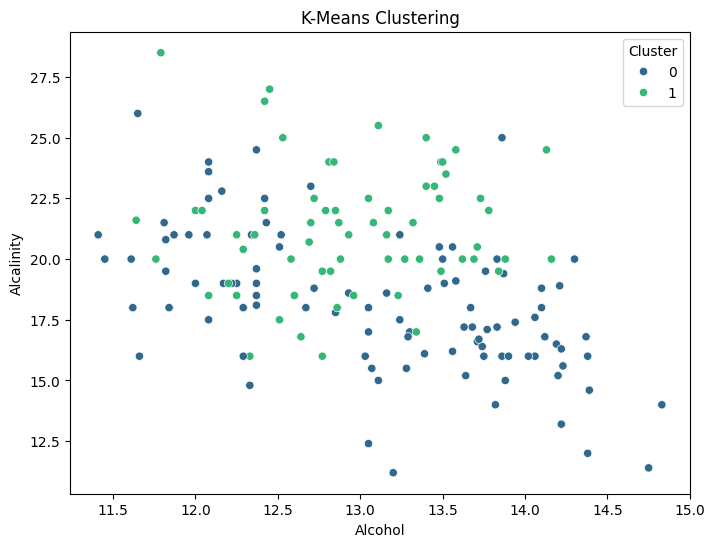

In [21]:
# Scatter plot for K-Means clustering
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Alcohol', y='Alcalinity', hue='Cluster', data=df, palette='viridis')
plt.title('K-Means Clustering')
plt.show()

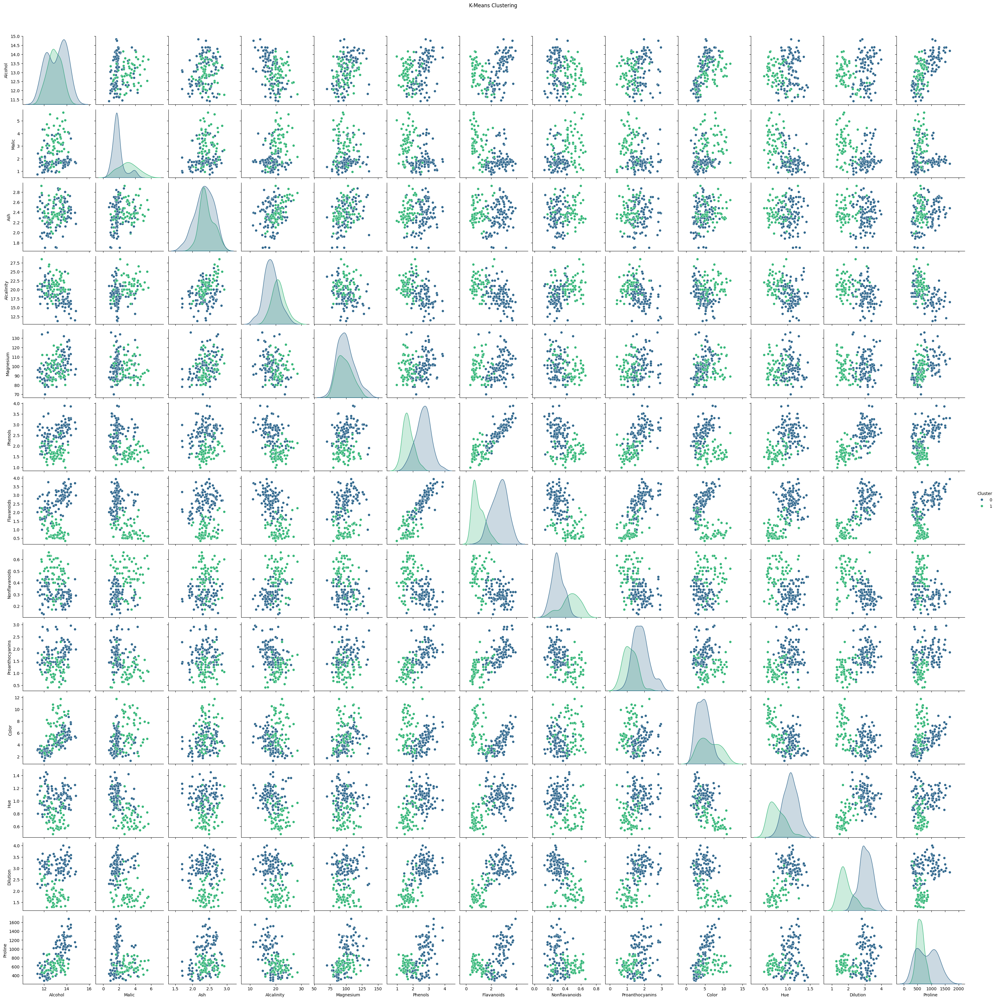

In [22]:
# Pair plot for K-Means clustering
sns.pairplot(df, vars=['Alcohol', 'Malic', 'Ash', 'Alcalinity', 'Magnesium', 'Phenols', 'Flavanoids', 'Nonflavanoids', 'Proanthocyanins', 'Color', 'Hue', 'Dilution', 'Proline'], hue='Cluster', palette='viridis')
plt.suptitle('K-Means Clustering', y=1.02)
plt.show()

# Remove the 'cluster' column
df.drop(columns=['Cluster'], inplace=True)

### **K-Means Clustering with PCA Data**

In [23]:
# Load the dataset
df = pd.read_csv('wine.csv')

In [24]:
# Keep a copy of the original dataset with 'Type'
df_original = df.copy()

In [25]:
# Drop the 'Type' column for clustering
X = df.drop(columns=['Type'])

In [26]:
# Normalize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [27]:
# Function to remove outliers using Z-score method
def remove_outliers_zscore(df, threshold=3):
    z_scores = np.abs(stats.zscore(df.select_dtypes(include=[np.number])))
    df = df[(z_scores < threshold).all(axis=1)]
    return df

# Remove outliers from the scaled dataset
X_scaled_df = pd.DataFrame(X_scaled, columns=X.columns)  # Convert scaled data back to DataFrame for z-score calculation
X_cleaned_df = remove_outliers_zscore(X_scaled_df)

# Print the number of rows before and after removing outliers
print("Number of rows before removing outliers:", X_scaled_df.shape[0])
print("Number of rows after removing outliers:", X_cleaned_df.shape[0])

# Convert cleaned DataFrame back to numpy array
X_cleaned = X_cleaned_df.to_numpy()

Number of rows before removing outliers: 178
Number of rows after removing outliers: 168


In [28]:
# Apply PCA
pca = PCA(n_components=2)  # Reduce to 2 dimensions for visualization
X_pca = pca.fit_transform(X_cleaned)

In [29]:
# Apply KMeans clustering to the cleaned scaled data
kmeans = KMeans(n_clusters=2, random_state=42)
kmeans.fit(X_cleaned)
df_original = df_original.iloc[X_cleaned_df.index]  # Adjust the original dataset to match the cleaned data
df_original['Cluster_Original'] = kmeans.labels_

In [30]:
# Apply KMeans clustering to the PCA-transformed data
kmeans_pca = KMeans(n_clusters=2, random_state=42)
kmeans_pca.fit(X_pca)
df_original['Cluster_PCA'] = kmeans_pca.labels_

In [31]:
# Calculate Silhouette Score for the PCA-transformed data clustering
silhouette_pca = silhouette_score(X_pca, kmeans_pca.labels_)
print("Silhouette Score for PCA-transformed data clustering:", silhouette_pca)

Silhouette Score for PCA-transformed data clustering: 0.4818223713075132


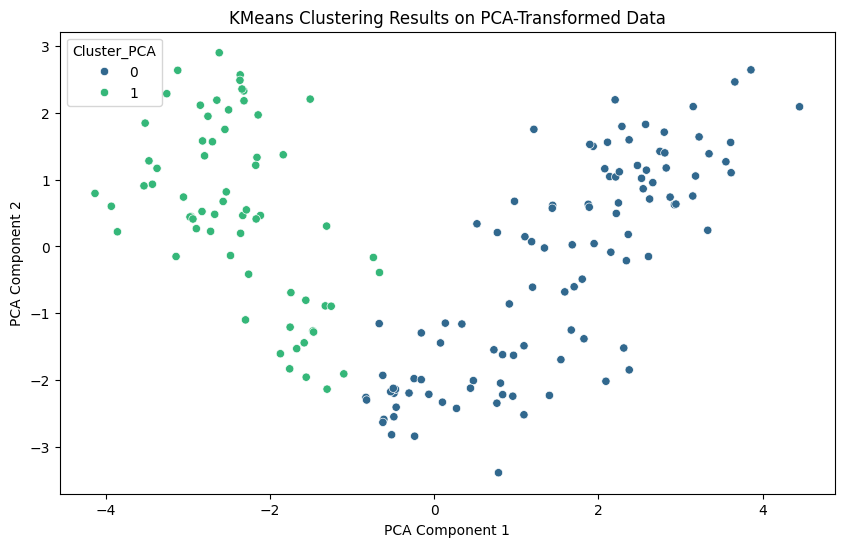

In [32]:
# Visualize the clustering results from PCA-transformed data
plt.figure(figsize=(10, 6))
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=df_original['Cluster_PCA'], palette='viridis')
plt.title('KMeans Clustering Results on PCA-Transformed Data')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.show()

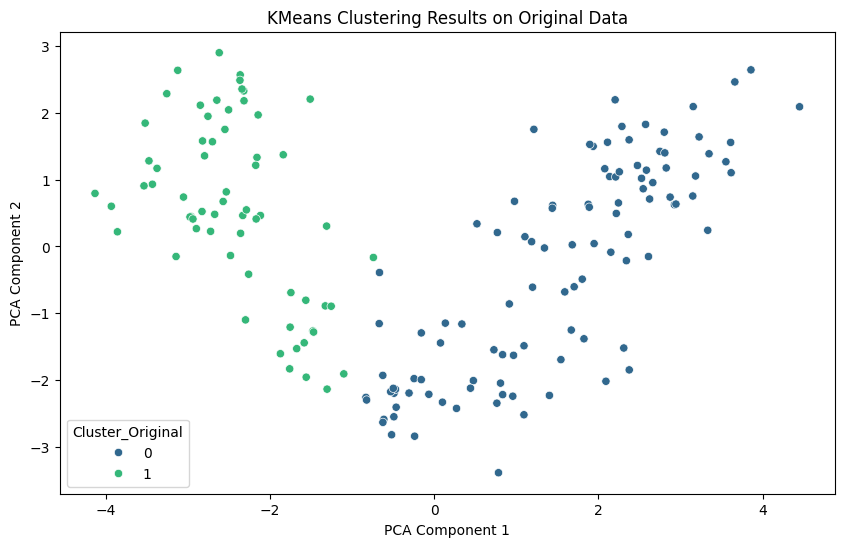

In [33]:
# Visualize the original clustering results for comparison
plt.figure(figsize=(10, 6))
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=df_original['Cluster_Original'], palette='viridis')
plt.title('KMeans Clustering Results on Original Data')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.show()

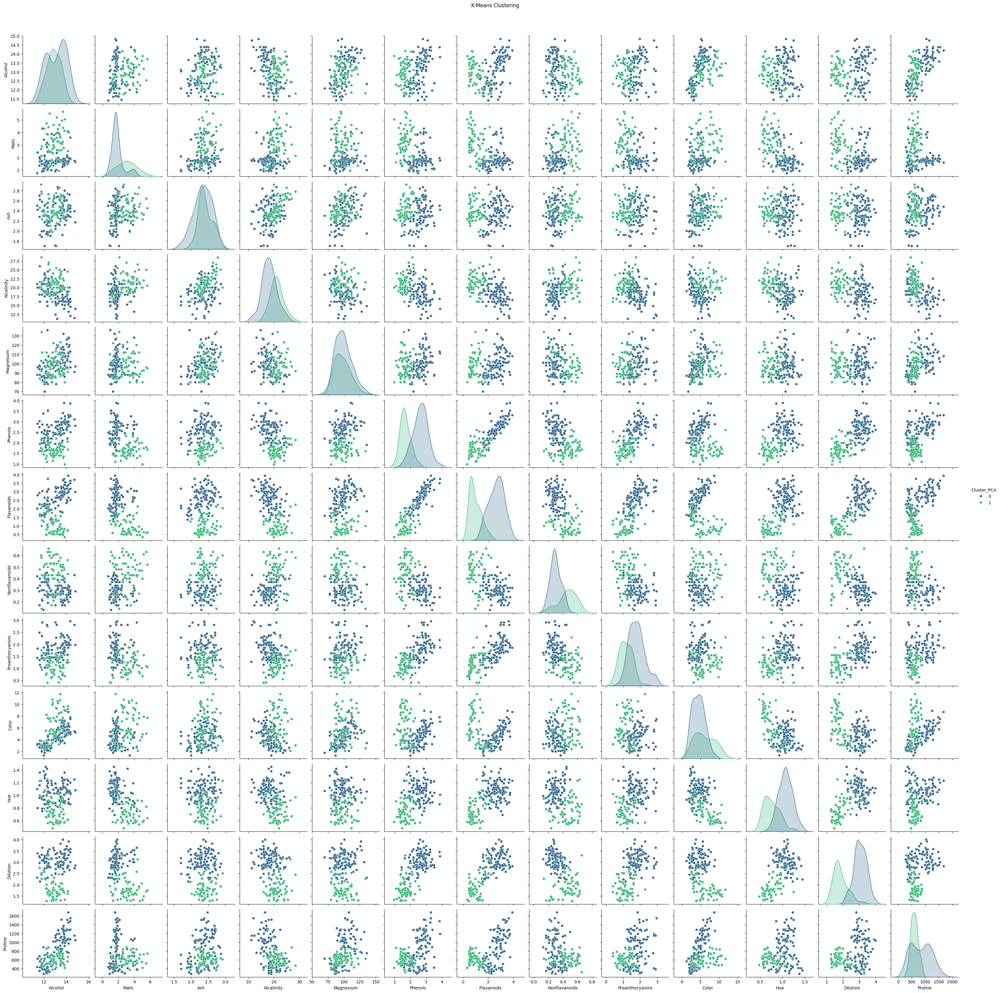

In [34]:
# Pair plot for K-Means clustering
sns.pairplot(df_original, vars=['Alcohol', 'Malic', 'Ash', 'Alcalinity', 'Magnesium', 'Phenols', 'Flavanoids', 'Nonflavanoids', 'Proanthocyanins', 'Color', 'Hue', 'Dilution', 'Proline'], hue='Cluster_PCA', palette='viridis')
plt.suptitle('K-Means Clustering', y=1.02)
plt.show()

In [35]:
# Compare the clustering results
comparison = df_original[['Type', 'Cluster_Original', 'Cluster_PCA']]
print(comparison.head())

   Type  Cluster_Original  Cluster_PCA
0     1                 0            0
1     1                 0            0
2     1                 0            0
3     1                 0            0
4     1                 0            0


In [37]:
# Compare the clustering results obtained from the original dataset and PCA-transformed data
# Summarize the clustering results
summary_original = df_original.groupby('Cluster_Original')['Type'].value_counts()
summary_pca = df_original.groupby('Cluster_PCA')['Type'].value_counts()

print("Cluster Distribution in Original Data:")
print(summary_original)

print("\nCluster Distribution in PCA Data:")
print(summary_pca)

Cluster Distribution in Original Data:
Cluster_Original  Type
0                 1       58
                  2       46
1                 3       47
                  2       17
Name: count, dtype: int64

Cluster Distribution in PCA Data:
Cluster_PCA  Type
0            1       58
             2       45
1            3       47
             2       18
Name: count, dtype: int64


**2. Discuss any similarities or differences observed in the clustering results**

*  Cluster Composition: By analyzing the cluster composition in the original and PCA-transformed data, we can identify similar types are grouped together.

*  
Visual Patterns: The scatter plots generated earlier can help in visualizing how well-separated the clusters are in both cases. The PCA clusters are more distinct or overlap less compared to the original, PCA might be aiding in better clustering.



**3. Reflect on the impact of dimensionality reduction on clustering performance**

*  Dimensionality Reduction: PCA reduces the dimensionality of the dataset, capturing the most variance with fewer features. This often makes it easier for clustering algorithms to find distinct groups.
*  Cluster Separation: If clusters from PCA are more well-separated or distinct, it suggests that PCA has effectively captured the essential structure of the data, aiding in better clustering performance.

*  Noise Reduction: PCA can also reduce noise by discarding less important features, which can improve clustering by focusing on the most significant aspects of the data.






**4. Analyze the trade-offs between using PCA and clustering directly on the original dataset**

*  PCA Advantages:
   *  Simplified Data: Reduces complexity, making it easier to visualize and understand.
   *  Improved Clustering: Can enhance clustering performance by highlighting key features.
   *  Noise Reduction: Removes less significant variance, potentially reducing the impact of noise.

*  PCA Disadvantages:  
   *  Loss of Information: Dimensionality reduction might discard important details.
   *  Interpretability: Principal components are linear combinations of original features, which can make interpretation harder.
   *  Preprocessing Step: Adds an additional step to the data preprocessing pipeline.
*  Original Data Clustering:
   *  Full Information: Utilizes all available features, retaining all information.
   *  Higher Complexity: More features can lead to higher complexity and potential overfitting.
   *  Direct Interpretation: Clusters are based on the original feature set, making interpretation straightforward.












